<a href="https://colab.research.google.com/github/rmendesl/TCC/blob/master/02_ExploratoryDataAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Análise Exploratória dos Dados (EDA)

A análise exploratória de dados verifica conjuntos de dados para resumir suas principais características, geralmente com métodos visuais. Assim, os cientistas de dados podem identificar facilmente as possíveis fraquezas no processo de aquisição de dados, que suposições eles devem fazer e que modelos podem aplicar para produzir resultados de análise.

Primeiramente, é realizada a inspeção dos dados e todas as suas propriedades. Existem diferentes tipos de dados, como os numéricos, os categóricos, os ordinais e os nominais. Por isso, há diferentes estatísticas descritivas que exigem a extração de características e o teste de variáveis significativas.

Como forma de apresentação dos padrões e tendências nos dados, usualmente são desenvolvidas técnicas de visualização de dados, incluindo dashboards interativos, tabelas dinâmicas e diferentes tipos de gráficos. Essas visualizações ajudam na demonstração da importância dos dados e como eles se relacionam com o problema ou solução a ser modelada.

Um ponto a ser ressaltado nessa etapa é o tratamento dado aos outliers.

Outiliers são dados que estão muito fora do padrão, isto é, são pontos completamente fora da curva.

Esses dados precisam ser tratados com atenção, pois eles podem, e provavelmente irão, causar anomalias nos resultados e sistemas de análise.

No entanto, nem sempre um outlier significa algo ruim. Ele pode levar a um resultado negativo, ou, por outro lado, pode indicar comportamentos procurados.

Fonte: https://awari.com.br/fases-projeto-data-science/

## Bibliotecas utilizadas

Referência para a bibioteca Pandas: https://pandas.pydata.org/docs/user_guide/index.html

Referência para a biblioteca Numpy: https://numpy.org/doc/

Referência para a biblioteca Seaborn: https://seaborn.pydata.org/tutorial.html

Referência para a biblioteca Matplotlib: https://matplotlib.org/index.html

In [1]:
# Importando os pacotes necessários
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Carregando os dados

### Montando o Drive do Google Drive

In [ ]:
# Execute apenas se desejar fazer o upload do arquivo local para o seu Google Drive
from google.colab import files
files.upload()

In [2]:
# Montando o drive do seu Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


### Carregando o arquivo para o dataframe

Use apenas uma das duas opções abaixo:

1.   Carregando direto do seu Google Drive;
2.   Carregando direto do link compartilhado;

Os dados limpos foram salvos em um arquivo CSV durante a etapa anterior.

* `base_clean.csv`

In [3]:
# Troque o caminho root_path caso seu arquivo esteja em outra pasta em seu drive
root_path = 'drive/My Drive/TCC/'
data = 'base_clean.csv'



---


1. Carregando direto do seu Google Drive

In [ ]:
# Carregando os dados do arquivo CSV para o dataframe
df_renovacao = pd.read_csv(root_path + data, sep='|')



---


2. Carregando direto do link compartilhado

In [4]:
# Use o link abaixo para ter acesso direto ao arquivo
link = "https://drive.google.com/uc?export=download&id=1-9h9OZ3s28D_RZrsWFAav3aB319fTRKI"

# Carregando os dados do arquivo CSV para o dataframe
df_renovacao = pd.read_csv(link, sep='|')



---



In [5]:
# Lendo os primeiros e últimos registros do dataframe
df_renovacao

,COD_MATRICULA,ALUNO_MATRICULADO_PROX_PERIODO,ALUNO_MATRICULADO,CONDICAO_GERENCIAL,CONDICAO_IMPEDE_RENOVACAO,TIPO_INADIMPLENCIA,RISCO_INADIMPLENCIA,COD_CURSO,COD_TURNO,COD_TIPO_CURSO,CLASSE_PAGANTE_ANT,CLASSE_PAGANTE_ATU,NOVO_FIES,PRV_ANT,PRV_ATU,LATE_COMER,NOM_SITUACAO_ALUNO,NOM_SITUACAO_PERIODO_ANT,VAL_A_PAGAR,VAL_A_PAGAR_PAR,VAL_DIVIDA_MENS,VAL_DIVIDA_TOTAL,FAIXA_DE_DIVIDA,ADIMP_N_REN,CR_PER_ANT,FAIXA_APROVACAO,QTD_ACESSOS_19_2,QTD_ACESSOS_20_1,IND_INDICIO_EVASAO,CLASSIFICACAO_PROP_EVASAO,CLASSIFICACAO_PROP_RENOVACAO,ACEITE_CONTRATO,PASTA_VERMELHA,REQ_AGEND_TRANC,SAFRA
0,200701339023,0,0,9 - ALTO PROPENSO,BOLETO RENOVACAO NAO PAGO,ADIMPLENTE,SEM RISCO,1,3,11,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,Cursado,51.18,0.00,0.00,0.00,SEM DIVIDA,1,9.00,7 - 100%,32.0,21.0,0,1 - Alto,3 - Médio Baixo,0,0,0,VETERANO
1,200702198245,0,0,8 - BAIXO PROPENSO,INADIMPLENTE,INADIMPLENTE SEM NEGOCIACAO,MEDIO RISCO,4004,3,11,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,Cursado,0.00,0.00,3111.20,3111.20,> 1500,0,5.91,4 - 41% A 60%,48.0,48.0,0,3 - Médio Baixo,4 - Baixo,1,0,0,CALOURO
2,200702198679,0,0,8 - BAIXO PROPENSO,INADIMPLENTE,INADIMPLENTE SEM NEGOCIACAO,MEDIO RISCO,29,3,11,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,Cursado,0.00,0.00,3238.77,3238.77,> 1500,0,5.27,3 - 21% A 40%,53.0,46.0,0,4 - Baixo,4 - Baixo,0,0,0,VETERANO
3,200801431011,1,1,1 - ALUNO RENOVADO,ALUNO RENOVADO,ADIMPLENTE,SEM RISCO,29,3,11,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,Cursado,2521.12,0.00,0.00,0.00,SEM DIVIDA,0,9.89,7 - 100%,130.0,119.0,0,4 - Baixo,2 - Médio Alto,1,0,0,VETERANO
4,200901402225,1,1,1 - ALUNO RENOVADO,ALUNO RENOVADO,ADIMPLENTE,BAIXO RISCO,1,3,11,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,Cursado,170.96,0.00,0.00,0.00,SEM DIVIDA,0,3.50,4 - 41% A 60%,125.0,70.0,0,00 - Não Escorado,00 - Não Escorado,1,0,0,VETERANO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2138,201912030837,1,1,1 - ALUNO RENOVADO,ALUNO RENOVADO,ADIMPLENTE,BAIXO RISCO,4004,3,11,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,Cursado,534.38,0.00,0.00,0.00,SEM DIVIDA,0,7.54,7 - 100%,143.0,133.0,0,4 - Baixo,3 - Médio Baixo,1,0,0,VETERANO
2139,201912030853,1,1,1 - ALUNO RENOVADO,ALUNO RENOVADO,ADIMPLENTE,BAIXO RISCO,4004,3,11,PAR,PAR,NÃO,0,0,ON TIME COMER,Ativo,Cursado,1157.48,5.16,0.00,5.16,SEM DIVIDA,0,6.31,5 - 61% A 80%,64.0,42.0,0,2 - Médio Alto,3 - Médio Baixo,1,0,0,VETERANO
2140,201912030861,0,0,2 - ALUNO EVADIDO,ALUNO EVADIDO SEM RENOVAR,ADIMPLENTE,MEDIO RISCO,2,3,11,PAR,PAR,NÃO,0,0,ON TIME COMER,Trancado,Cursado,0.00,4.88,0.00,0.00,SEM DIVIDA,0,7.43,7 - 100%,154.0,109.0,1,3 - Médio Baixo,3 - Médio Baixo,1,0,0,VETERANO
2141,201912030934,1,1,1 - ALUNO RENOVADO,ALUNO RENOVADO,INADIMPLENTE COM NEGOCIACAO,BAIXO RISCO,29,3,11,PAR,PAR,NÃO,0,0,ON TIME COMER,Ativo,Cursado,1486.82,606.04,0.00,489.79,SEM DIVIDA,0,6.14,7 - 100%,154.0,147.0,0,4 - Baixo,3 - Médio Baixo,1,0,0,VETERANO


## Análise exploratória com Pandas Profiling

O [Pandas Profiling](https://github.com/pandas-profiling/pandas-profiling) é um módulo **open source** do Ptyhon com o qual podemos fazer rapidamente uma análise exploratória de dados com apenas algumas linhas de código. 

Ele também gera relatórios interativos em formato web que podem ser apresentados a qualquer pessoa.

Em resumo, o que o **Pandas Profiling** faz é economizar todo o trabalho de visualizar e entender a distribuição de cada variável. Ele gera um relatório com todas as informações facilmente disponíveis.

Para cada coluna, as seguintes estatísticas abaixo, se relevantes para o tipo de coluna, são apresentadas em um relatório HTML interativo:

* **Inferência de tipo**: detecta os tipos de colunas no dataframe
* **Essencial**: tipo, valores únicos, valores ausentes
* **Estatísticas quantílicas** como valor mínimo, Q1, mediana, Q3, máximo, intervalo, intervalo interquartil
* **Estatisticas descritivas** como média, moda, desvio padrão, soma, desvio  médio absoluto, coeficiente de variação, curtose, assimetria
* **Valores mais frequentes**
* **Histograma**
* **Correlações** destacando variáveis altamente correlacionadas, matrizes de Spearman, Pearson e Kendall
* **Matriz de valores ausentes**, contagem, mapa de calor e dendrograma de valores ausentes
* **A análise de texto** aprende sobre categorias (Maiúsculas, Espaço), scripts (Latim, Cirílico) e blocos (ASCII) de dados de texto.
* **A análise de arquivo e imagem** extrai tamanhos de arquivo, datas e dimensões de criação e verifica imagens truncadas ou que contêm informações EXIF.



---


O Pandas Profiling pode já vir instalado no Colab, porém iremos realizar a instalação com o parâmetro -U. Dessa forma, caso tenha alguma atualização, ela já será aplicada.

`!pip install -U pandas-profiling`

In [ ]:
!pip install -U pandas-profiling

In [ ]:
# Importar o pacote necessário
from pandas_profiling import ProfileReport

### Gerando o Report para nossa análise

In [ ]:
# Gerar o report de nosso DataFrame
report = ProfileReport(df_renovacao, title="Rematrícula Profiling Report", sort='None', html={'style':{'full_width': True}}, progress_bar=False)

In [ ]:
# Visualizando o relatório
report.to_notebook_iframe()

### Salvando nosso Report externamente

Podemos exportar nosso relatório para análise detalhada, pois o Pandas Profiling gera um arquivo HTML.

* `profiling_report_rematricula.html`

**OBS:** Substitua o local de destino pelo seu local de preferência

O relatório está disponível em:

https://drive.google.com/uc?export=download&id=1Oc0B84gxVVxX5iiJszU66gpeZXYlfhAg

In [ ]:
# Para exportar o relatório, substitua o caminho pelo de sua preferência
file_path = '/content/drive/My Drive/TCC/profiling_report_rematricula.html'

report.to_file(output_file = file_path)

## Selecionando e excluindo colunas


Após análise detalhada do Report verificamos que ainda existem variáveis que podem ser excluídas:

* `NOM_SITUACAO_PERIODO_ANT` - 100% dos registros estão com valor 'Cursado'
* `PASTA_VERMELHA` - 99.9% dos registros estão com valor 0

In [ ]:
# Exclui as variáveis
df_renovacao.drop(['NOM_SITUACAO_PERIODO_ANT', 'PASTA_VERMELHA'], axis=1, inplace=True)

df_renovacao

,COD_MATRICULA,ALUNO_MATRICULADO_PROX_PERIODO,ALUNO_MATRICULADO,CONDICAO_GERENCIAL,CONDICAO_IMPEDE_RENOVACAO,TIPO_INADIMPLENCIA,RISCO_INADIMPLENCIA,COD_CURSO,COD_TURNO,COD_TIPO_CURSO,CLASSE_PAGANTE_ANT,CLASSE_PAGANTE_ATU,NOVO_FIES,PRV_ANT,PRV_ATU,LATE_COMER,NOM_SITUACAO_ALUNO,VAL_A_PAGAR,VAL_A_PAGAR_PAR,VAL_DIVIDA_MENS,VAL_DIVIDA_TOTAL,FAIXA_DE_DIVIDA,ADIMP_N_REN,CR_PER_ANT,FAIXA_APROVACAO,QTD_ACESSOS_19_2,QTD_ACESSOS_20_1,IND_INDICIO_EVASAO,CLASSIFICACAO_PROP_EVASAO,CLASSIFICACAO_PROP_RENOVACAO,ACEITE_CONTRATO,REQ_AGEND_TRANC,SAFRA
0,200701339023,0,0,9 - ALTO PROPENSO,BOLETO RENOVACAO NAO PAGO,ADIMPLENTE,SEM RISCO,1,3,11,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,51.18,0.00,0.00,0.00,SEM DIVIDA,1,9.00,7 - 100%,32.0,21.0,0,1 - Alto,3 - Médio Baixo,0,0,VETERANO
1,200702198245,0,0,8 - BAIXO PROPENSO,INADIMPLENTE,INADIMPLENTE SEM NEGOCIACAO,MEDIO RISCO,4004,3,11,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,0.00,0.00,3111.20,3111.20,> 1500,0,5.91,4 - 41% A 60%,48.0,48.0,0,3 - Médio Baixo,4 - Baixo,1,0,CALOURO
2,200702198679,0,0,8 - BAIXO PROPENSO,INADIMPLENTE,INADIMPLENTE SEM NEGOCIACAO,MEDIO RISCO,29,3,11,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,0.00,0.00,3238.77,3238.77,> 1500,0,5.27,3 - 21% A 40%,53.0,46.0,0,4 - Baixo,4 - Baixo,0,0,VETERANO
3,200801431011,1,1,1 - ALUNO RENOVADO,ALUNO RENOVADO,ADIMPLENTE,SEM RISCO,29,3,11,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,2521.12,0.00,0.00,0.00,SEM DIVIDA,0,9.89,7 - 100%,130.0,119.0,0,4 - Baixo,2 - Médio Alto,1,0,VETERANO
4,200901402225,1,1,1 - ALUNO RENOVADO,ALUNO RENOVADO,ADIMPLENTE,BAIXO RISCO,1,3,11,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,170.96,0.00,0.00,0.00,SEM DIVIDA,0,3.50,4 - 41% A 60%,125.0,70.0,0,00 - Não Escorado,00 - Não Escorado,1,0,VETERANO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2138,201912030837,1,1,1 - ALUNO RENOVADO,ALUNO RENOVADO,ADIMPLENTE,BAIXO RISCO,4004,3,11,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,534.38,0.00,0.00,0.00,SEM DIVIDA,0,7.54,7 - 100%,143.0,133.0,0,4 - Baixo,3 - Médio Baixo,1,0,VETERANO
2139,201912030853,1,1,1 - ALUNO RENOVADO,ALUNO RENOVADO,ADIMPLENTE,BAIXO RISCO,4004,3,11,PAR,PAR,NÃO,0,0,ON TIME COMER,Ativo,1157.48,5.16,0.00,5.16,SEM DIVIDA,0,6.31,5 - 61% A 80%,64.0,42.0,0,2 - Médio Alto,3 - Médio Baixo,1,0,VETERANO
2140,201912030861,0,0,2 - ALUNO EVADIDO,ALUNO EVADIDO SEM RENOVAR,ADIMPLENTE,MEDIO RISCO,2,3,11,PAR,PAR,NÃO,0,0,ON TIME COMER,Trancado,0.00,4.88,0.00,0.00,SEM DIVIDA,0,7.43,7 - 100%,154.0,109.0,1,3 - Médio Baixo,3 - Médio Baixo,1,0,VETERANO
2141,201912030934,1,1,1 - ALUNO RENOVADO,ALUNO RENOVADO,INADIMPLENTE COM NEGOCIACAO,BAIXO RISCO,29,3,11,PAR,PAR,NÃO,0,0,ON TIME COMER,Ativo,1486.82,606.04,0.00,489.79,SEM DIVIDA,0,6.14,7 - 100%,154.0,147.0,0,4 - Baixo,3 - Médio Baixo,1,0,VETERANO


## Distribuição e análises gráficas das variáveis

###Relação entre o número de acessos em um determinado período ao Portal Acadêmico.

Variáveis relacionadas:

* `QTD_ACESSOS_19_2` (números de acessos em fevereiro do ano corrente)
* `QTD_ACESSOS_20_1` (números de acessos em janeiro do ano corrente)

Essas 02(duas) variáveis foram escolhidas por demonstrarem uma alta correlação no Report e principalmente por terem sido apontadas pelo *stakeholder* por existir evidências de que os acessos ao Portal Acadêmico pelo aluno no período anterior a rematrícula, demonstra engajamento e preocupação com sua situação acadêmica, entre elas:

* Notas;
* Débitos em aberto;
* Pagamentos de mensalidades;

O que a correlação procura entender é como uma variável se comporta em um cenário onde outra está variando, visando identificar se existe alguma relação entre a variabilidade de ambas. Embora não implique em causalidade, o coeficiente de correlação exprime em números essa relação, ou seja, quantifica a relação entre as variáveis.

Em sua grande maioria dos casos, foi confirmada essa relação com a ***variável alvo*** e demais variáveis.

Vamos verificar logo abaixo.


Criamos novas colunas no dataframe com o mesmo conteúdo das variáveis abaixo para melhor entendimento e apresentação nos gráficos abaixo.

* `ALUNO_MATRICULADO_PROX_PERIODO` ***(variável alvo)***
 * Nova coluna `REMATRICULADO`
    * *0* - Não rematriculado
    * *1* - Rematriculado
* `QTD_ACESSOS_20_1` (números de acessos em janeiro do ano corrente)
 * Nova coluna `JANEIRO`
* `QTD_ACESSOS_19_2` (números de acessos em fevereiro do ano corrente)
 * Nova coluna `FEVEREIRO`

In [7]:
# Cria novas colunas no dataframe
df_renovacao['REMATRICULADO'] = df_renovacao['ALUNO_MATRICULADO_PROX_PERIODO']
df_renovacao['JANEIRO'] = df_renovacao['QTD_ACESSOS_20_1']
df_renovacao['FEVEREIRO'] = df_renovacao['QTD_ACESSOS_19_2']



---


Variável de agrupamento:

* `ALUNO_MATRICULADO_PROX_PERIODO` ***(variável alvo)***
 * *0* - Não rematriculado
 * *1* - Rematriculado

Nessa relação podemos observar nos gráficos que os alunos que mais acessaram o Portal Acadêmico foram os que tiveram o mais alto percentual de rematrículas confirmadas.


---


O gráfico de dispersão (scatter plot) é um dos pilares da visualização estatística. Ele descreve a distribuição conjunta de duas variáveis ​​usando uma nuvem de pontos, onde cada ponto representa uma observação no conjunto de dados. Essa representação permite que o olho deduza uma quantidade substancial de informações sobre se existe algum relacionamento significativo entre eles.

Esse tipo de gráfico fornece acesso a várias funções diferentes no nível de eixos que mostram o relacionamento entre duas variáveis ​​com mapeamentos semânticos de subconjuntos.

Referência : https://seaborn.pydata.org/generated/seaborn.relplot.html

Referência : https://seaborn.pydata.org/tutorial/relational.html#relational-tutorial

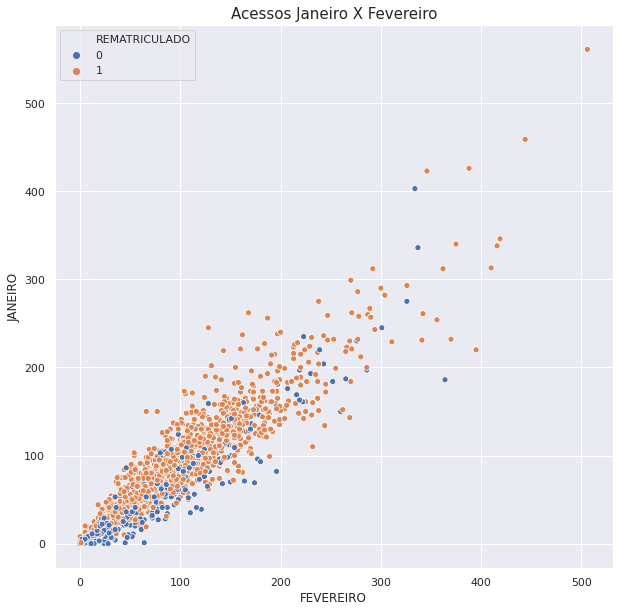

In [ ]:
# Cria os gráficos da relação entre as variáveis relacionadas e a variável alvo
fig, axs = plt.subplots(figsize=(10, 10), ncols=1)
g1 = sns.scatterplot(x='FEVEREIRO', y='JANEIRO', hue='REMATRICULADO', data=df_renovacao, ax=axs)

g1.set_title('Acessos Janeiro X Fevereiro', size=15)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#fig.savefig('/content/drive/My Drive/TCC/Graficos/g1.png')

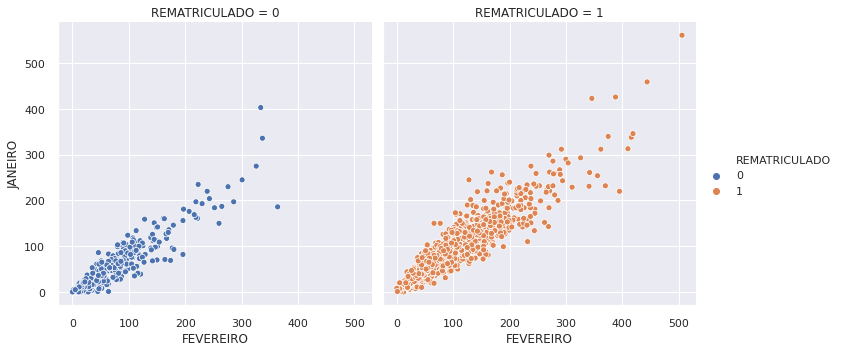

In [ ]:
g2 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='REMATRICULADO', col='REMATRICULADO',  data=df_renovacao)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#g2.savefig('/content/drive/My Drive/TCC/Graficos/g2.png')



---


Variáveis de agrupamento:

* `CLASSIFICACAO_PROP_EVASAO`
* `ALUNO_MATRICULADO_PROX_PERIODO` ***(variável alvo)***
 * *0* - Não rematriculado
 * *1* - Rematriculado

Nessa relação podemos observar nos gráficos que os alunos com a variável **Classificação Propensa à Evasão**, com os seguintes valores:

* *3 - Médio Baixo*
* *4 - Baixo*

Foram os que tiveram mais acessos ao Portal Acadêmico, e também foram as categorias que mais tiveram suas rematrículas confirmadas.

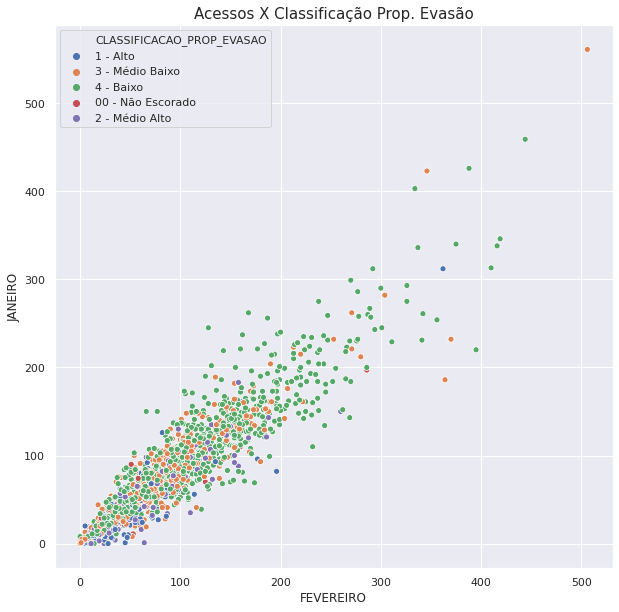

In [ ]:
# Cria os gráficos da relação entre as variáveis 
fig, axs = plt.subplots(figsize=(10, 10), ncols=1)
g3 = sns.scatterplot(x='FEVEREIRO', y='JANEIRO', hue='CLASSIFICACAO_PROP_EVASAO', data=df_renovacao, ax=axs)

g3.set_title('Acessos X Classificação Prop. Evasão', size=15)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#fig.savefig('/content/drive/My Drive/TCC/Graficos/g3.png')

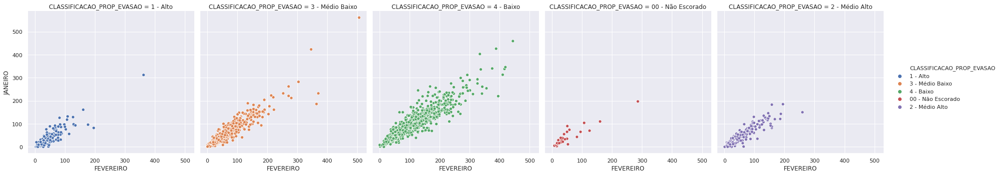

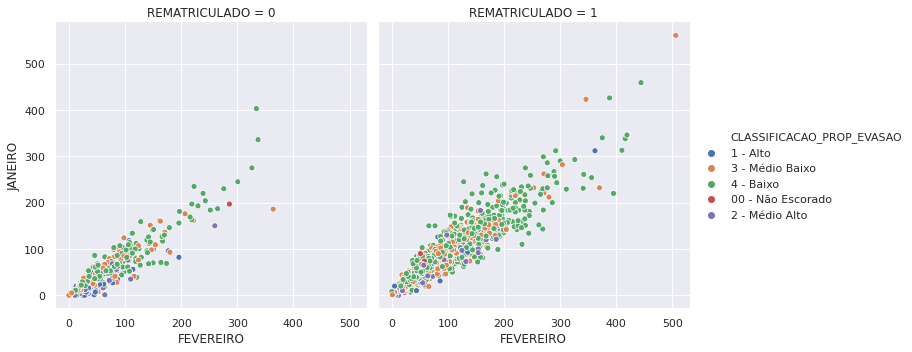

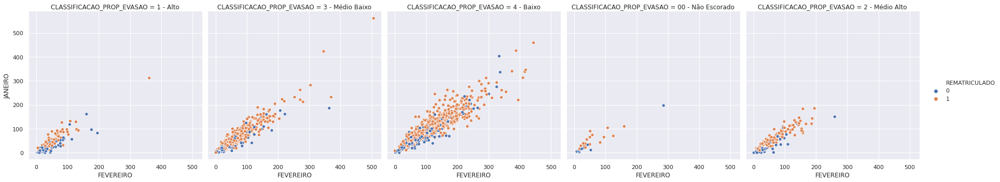

In [ ]:
# Cria os gráficos da relação entre as variáveis relacionadas e a variável alvo
g4 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='CLASSIFICACAO_PROP_EVASAO', col='CLASSIFICACAO_PROP_EVASAO', data=df_renovacao)
g5 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='CLASSIFICACAO_PROP_EVASAO', col='REMATRICULADO', data=df_renovacao)
g6 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='REMATRICULADO', col='CLASSIFICACAO_PROP_EVASAO', data=df_renovacao)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#g4.savefig('/content/drive/My Drive/TCC/Graficos/g4.png')
#g5.savefig('/content/drive/My Drive/TCC/Graficos/g5.png')
#g6.savefig('/content/drive/My Drive/TCC/Graficos/g6.png')



---


Variáveis de agrupamento:

* `CLASSIFICACAO_PROP_RENOVACAO`
* `ALUNO_MATRICULADO_PROX_PERIODO` ***(variável alvo)***
 * *0* - Não rematriculado
 * *1* - Rematriculado

Nessa relação podemos observar nos gráficos que os alunos com a variável **Classificação Propensa à Renovação**, com os seguintes valores:

* *2 - Médio Alto*
* *3 - Médio Baixo*

Foram os que tiveram mais acessos ao Portal Acadêmico, e também foram as categorias que mais tivaram suas rematrículas confirmadas.

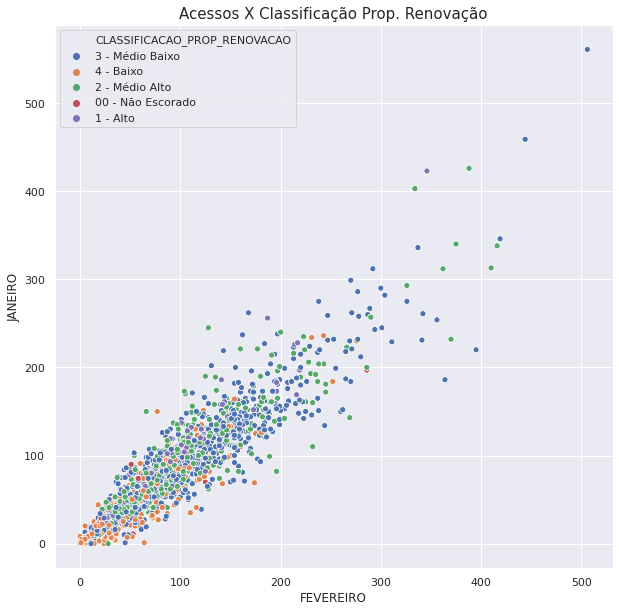

In [ ]:
# Cria os gráficos da relação entre as variáveis 
fig, axs = plt.subplots(figsize=(10, 10), ncols=1)
g7 = sns.scatterplot(x='FEVEREIRO', y='JANEIRO', hue='CLASSIFICACAO_PROP_RENOVACAO', data=df_renovacao, ax=axs)

g7.set_title('Acessos X Classificação Prop. Renovação', size=15)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#fig.savefig('/content/drive/My Drive/TCC/Graficos/g7.png')

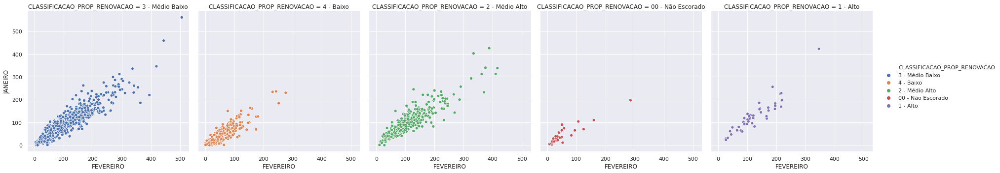

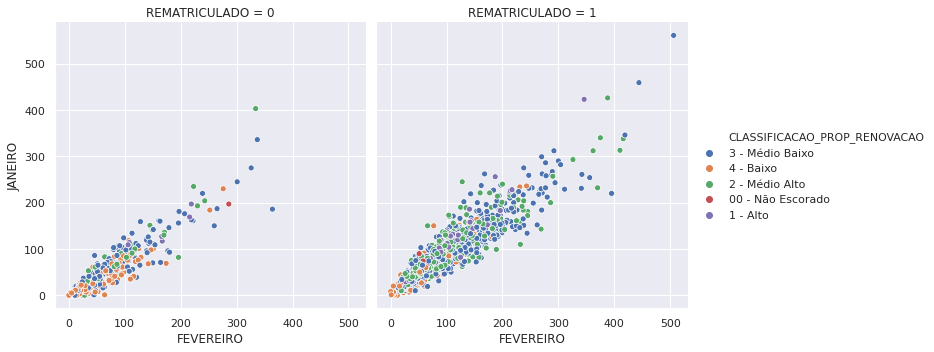

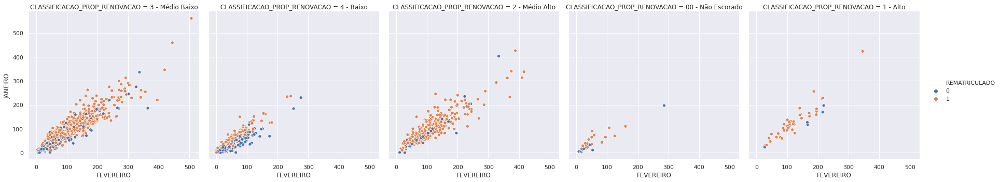

In [ ]:
# Cria os gráficos da relação entre as variáveis relacionadas e a variável alvo
g8 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='CLASSIFICACAO_PROP_RENOVACAO', col='CLASSIFICACAO_PROP_RENOVACAO', data=df_renovacao)
g9 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='CLASSIFICACAO_PROP_RENOVACAO', col='REMATRICULADO', data=df_renovacao)
g10 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='REMATRICULADO', col='CLASSIFICACAO_PROP_RENOVACAO', data=df_renovacao)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#g8.savefig('/content/drive/My Drive/TCC/Graficos/g8.png')
#g9.savefig('/content/drive/My Drive/TCC/Graficos/g9.png')
#g10.savefig('/content/drive/My Drive/TCC/Graficos/g10.png')



---


Variáveis de agrupamento:

* `RISCO_INADIMPLENCIA`
* `ALUNO_MATRICULADO_PROX_PERIODO` ***(variável alvo)***
 * *0* - Não rematriculado
 * *1* - Rematriculado

Nessa relação podemos observar nos gráficos que os alunos com a variável **Risco de Inadimplência**, com os seguintes valores:

* *SEM RISCO*
* *BAIXO RISCO*

Foram os que tiveram mais acessos ao Portal Acadêmico, e também foram as categorias que mais tivaram suas rematrículas confirmadas.

Temos que considerar também que as categorias:

* *MEDIO RISCO*
* *ALTO RISCO*

Tiveram em sua maioria as rematrículas confirmadas.

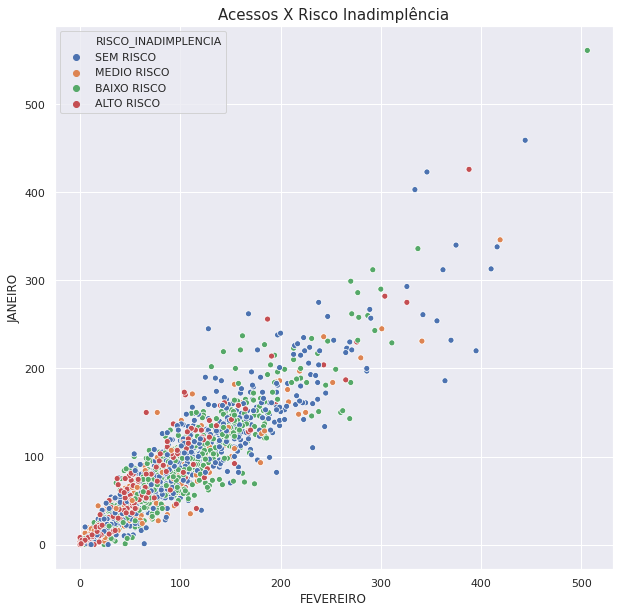

In [ ]:
# Cria os gráficos da relação entre as variáveis 
fig, axs = plt.subplots(figsize=(10, 10), ncols=1)
g11 = sns.scatterplot(x='FEVEREIRO', y='JANEIRO', hue='RISCO_INADIMPLENCIA', data=df_renovacao, ax=axs)

g11.set_title('Acessos X Risco Inadimplência', size=15)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#fig.savefig('/content/drive/My Drive/TCC/Graficos/g11.png')

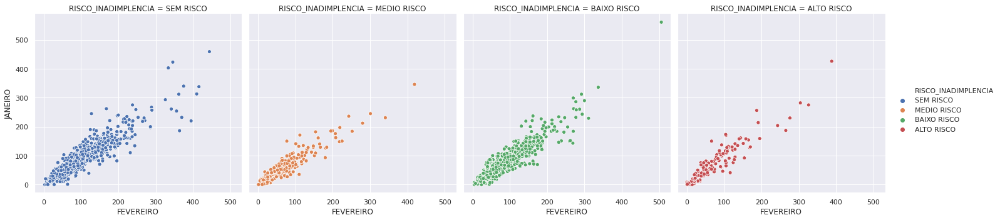

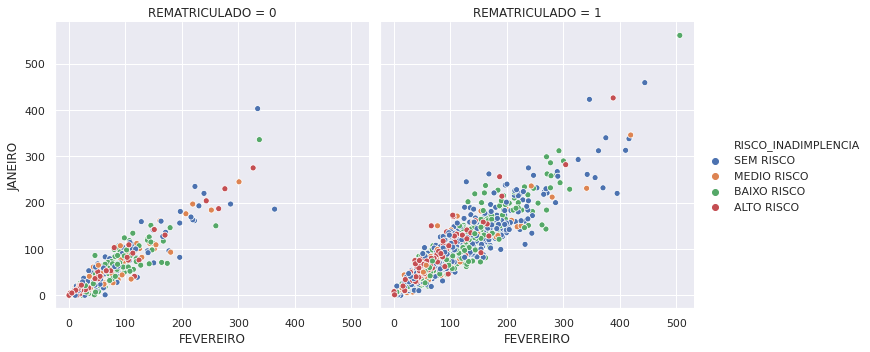

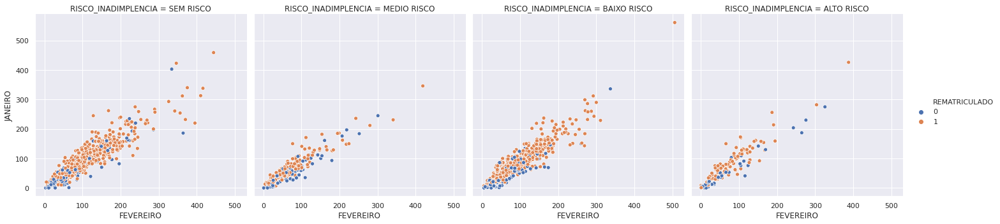

In [ ]:
# Cria os gráficos da relação entre as variáveis relacionadas e a variável alvo
g12 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='RISCO_INADIMPLENCIA', col='RISCO_INADIMPLENCIA', data=df_renovacao)
g13 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='RISCO_INADIMPLENCIA', col='REMATRICULADO', data=df_renovacao)
g14 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='REMATRICULADO', col='RISCO_INADIMPLENCIA', data=df_renovacao)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#g12.savefig('/content/drive/My Drive/TCC/Graficos/g12.png')
#g13.savefig('/content/drive/My Drive/TCC/Graficos/g13.png')
#g14.savefig('/content/drive/My Drive/TCC/Graficos/g14.png')


---


Variáveis de agrupamento:

* `TIPO_INADIMPLENCIA`
* `ALUNO_MATRICULADO_PROX_PERIODO` ***(variável alvo)***
 * *0* - Não rematriculado
 * *1* - Rematriculado

Nessa relação podemos observar no gráfico que os alunos com a variável **Tipo de Inadimplência**, com o seguinte valor:

* *ADIMPLENTE*

Foram os que tiveram mais acessos ao Portal Acadêmico, e também foi a categoria que mais teve suas rematrículas confirmadas.

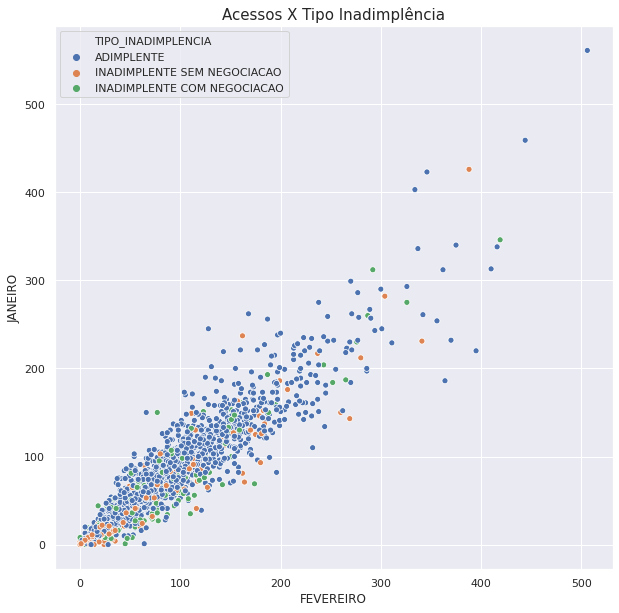

In [ ]:
# Cria os gráficos da relação entre as variáveis 
fig, axs = plt.subplots(figsize=(10, 10), ncols=1)
g15 = sns.scatterplot(x='FEVEREIRO', y='JANEIRO', hue='TIPO_INADIMPLENCIA', data=df_renovacao, ax=axs)

g15.set_title('Acessos X Tipo Inadimplência', size=15)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#fig.savefig('/content/drive/My Drive/TCC/Graficos/g15.png')

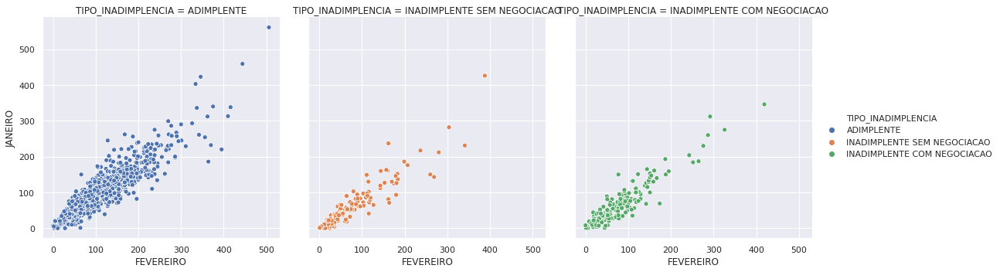

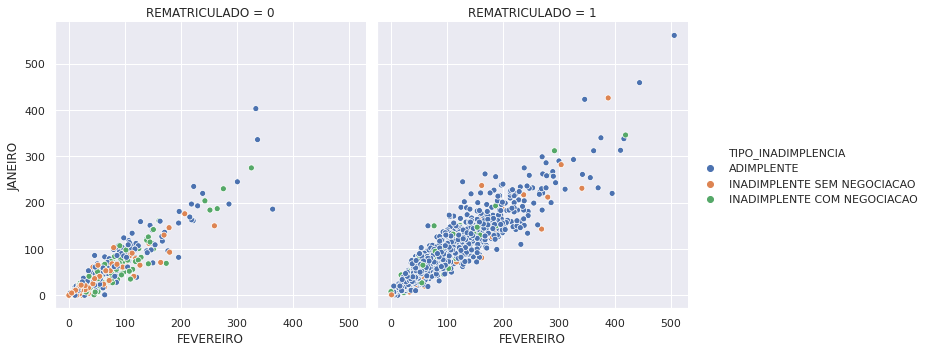

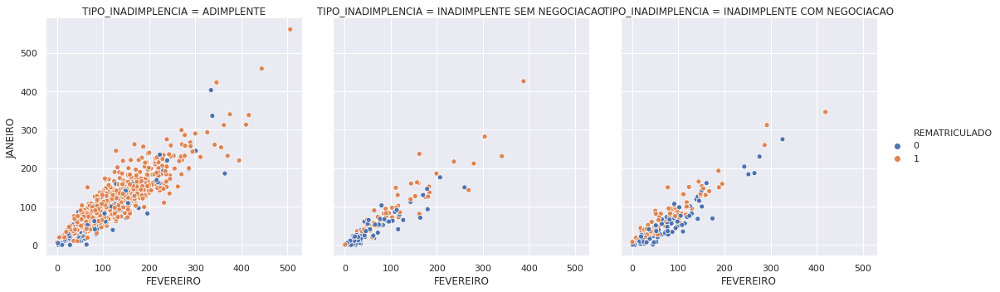

In [ ]:
# Cria os gráficos da relação entre as variáveis relacionadas e a variável alvo
g16 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='TIPO_INADIMPLENCIA', col='TIPO_INADIMPLENCIA', data=df_renovacao)
g17 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='TIPO_INADIMPLENCIA', col='REMATRICULADO', data=df_renovacao)
g18 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='REMATRICULADO', col='TIPO_INADIMPLENCIA', data=df_renovacao)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#g16.savefig('/content/drive/My Drive/TCC/Graficos/g16.png')
#g17.savefig('/content/drive/My Drive/TCC/Graficos/g17.png')
#g18.savefig('/content/drive/My Drive/TCC/Graficos/g18.png')


---


Variáveis de agrupamento:

* `FAIXA_DE_DIVIDA`
* `ALUNO_MATRICULADO_PROX_PERIODO` ***(variável alvo)***
 * *0* - Não rematriculado
 * *1* - Rematriculado

Nessa relação podemos observar no gráfico que os alunos com a variável **Faixa de Dívida**, com o seguinte valor:

* *SEM DIVIDA*

Foram os que teviram mais acessos ao Portal Acadêmico, e também foi a categoria que mais teve suas rematrículas confirmadas.

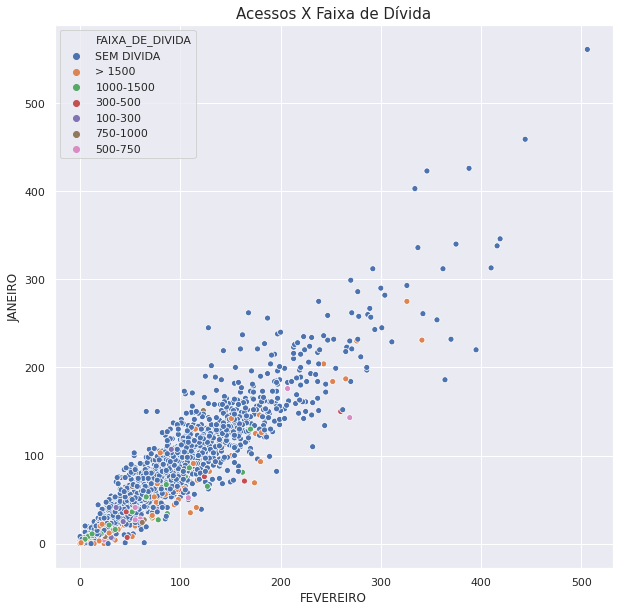

In [12]:
# Cria os gráficos da relação entre as variáveis 
fig, axs = plt.subplots(figsize=(10, 10), ncols=1)
g34 = sns.scatterplot(x='FEVEREIRO', y='JANEIRO', hue='FAIXA_DE_DIVIDA', data=df_renovacao, ax=axs)

g34.set_title('Acessos X Faixa de Dívida', size=15)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#fig.savefig('/content/drive/My Drive/TCC/Graficos/g34.png')

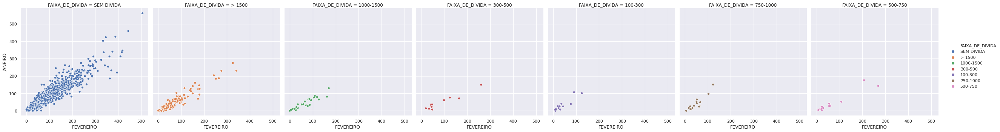

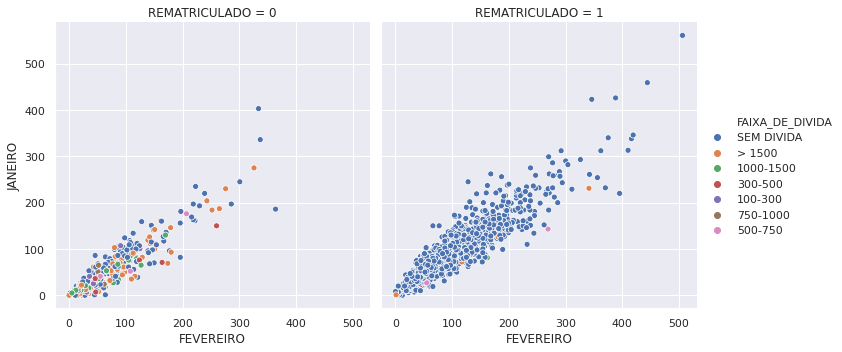

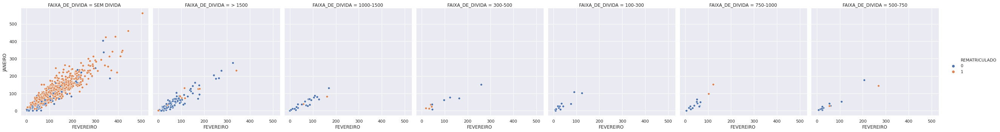

In [13]:
# Cria os gráficos da relação entre as variáveis relacionadas e a variável alvo
g35 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='FAIXA_DE_DIVIDA', col='FAIXA_DE_DIVIDA', data=df_renovacao)
g36 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='FAIXA_DE_DIVIDA', col='REMATRICULADO', data=df_renovacao)
g37 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='REMATRICULADO', col='FAIXA_DE_DIVIDA', data=df_renovacao)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#g35.savefig('/content/drive/My Drive/TCC/Graficos/g35.png')
#g36.savefig('/content/drive/My Drive/TCC/Graficos/g36.png')
#g37.savefig('/content/drive/My Drive/TCC/Graficos/g37.png')

### Relação entre as variáveis *Condição Gerencial* e *Condição que Impede Renovação*

Variáveis de agrupamento:

* `CONDICAO_GERENCIAL`
* `ALUNO_MATRICULADO_PROX_PERIODO` ***(variável alvo)***
 * *0* - Não rematriculado
 * *1* - Rematriculado

Nessa relação podemos observar nos gráficos que os alunos com a variável **Condição Gerencial**, com o seguinte valor:

* *1 - ALUNO RENOVADO*

Foram os que tiveram mais acessos ao Portal Acadêmico, e também foram as categorias que mais tivaram suas rematrículas confirmadas.

Porém nota-se claramente um correlação quase que perfeita com a ***variável alvo***, o que pode configurar uma "**multicolinearidade**".

---


**Multicolinearidade** consiste em um problema comum em regressões, no qual as variáveis independentes possuem relações lineares exatas ou aproximadamente exatas. O indício mais claro da existência da multicolinearidade é quando o *R²* é bastante alto, mas nenhum dos coeficientes da regressão é estatisticamente significativo segundo a *estatística t* convencional. As consequências da multicolinearidade em uma regressão são a de erros-padrão elevados no caso de multicolinearidade moderada ou severa e até mesmo a impossibilidade de qualquer estimação se a multicolinearidade for perfeita. Fonte: https://pt.wikipedia.org/wiki/Multicolinearidade

Uma forma de corrigir a multicolinearidade é removendo variáveis preditoras fortemente correlacionadas ao modelo.

Multicolinearidade refere-se a variáveis preditoras correlacionadas com outras preditoras. A multicolinearidade ocorre quando o modelo inclui vários fatores correlacionados não apenas à sua ***variável de resposta/alvo***, mas também uns aos outros. Quando trabalhamos com mais de uma variável regressora, é muito importante verificar se essas variáveis explicativas são correlacionadas. Na literatura, os termos colinearidade (multicolinearidade) são utilizados para indicar a existência forte de correlação entre duas (ou mais) variáveis independentes.

**OBS:** É muito importante lembrar que o nosso modelo de aprendizagem supervisionada será um modelo de Classificação e não Regressão. Porém, com relação a essas variáveis abaixo, existem motivos fortes para serem considerados e foram informados pelo *stackeholder* do projeto.

* `CONDICAO_GERENCIAL`
* `CONDICAO_IMPEDE_RENOVACAO`

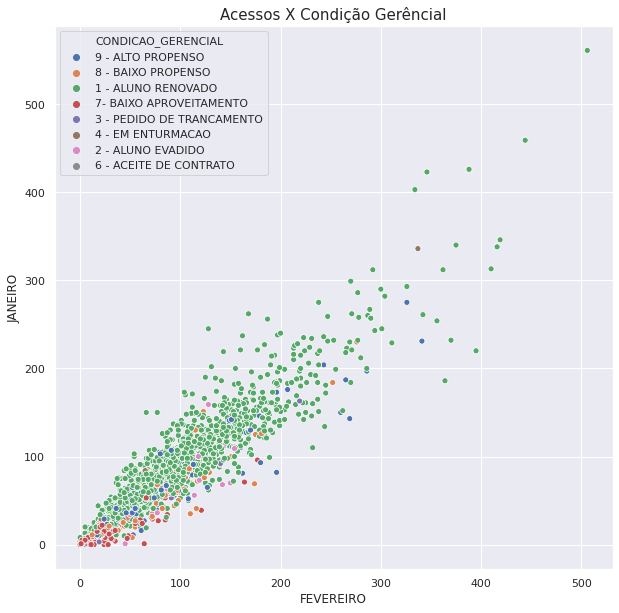

In [ ]:
# Cria os gráficos da relação entre as variáveis 
fig, axs = plt.subplots(figsize=(10, 10), ncols=1)
g19 = sns.scatterplot(x='FEVEREIRO', y='JANEIRO', hue='CONDICAO_GERENCIAL', data=df_renovacao, ax=axs)

g19.set_title('Acessos X Condição Gerêncial', size=15)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#fig.savefig('/content/drive/My Drive/TCC/Graficos/g19.png')

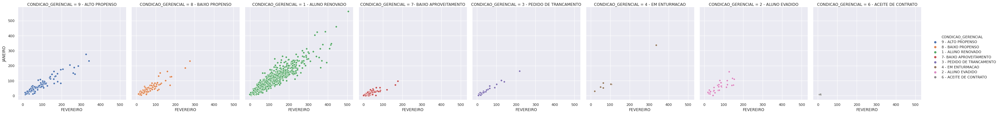

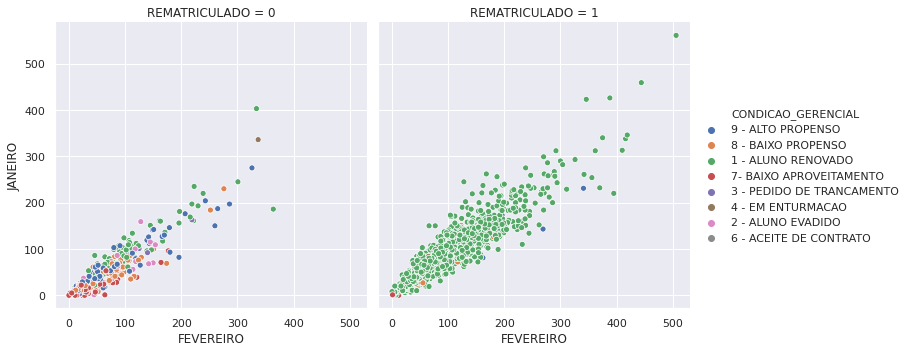

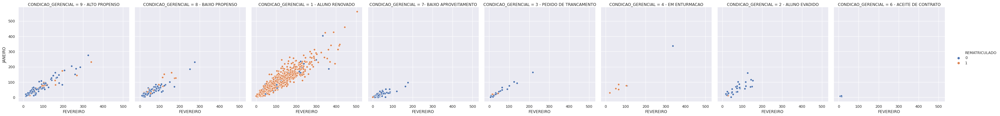

In [ ]:
# Cria os gráficos da relação entre as variáveis relacionadas e a variável alvo
g20 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='CONDICAO_GERENCIAL', col='CONDICAO_GERENCIAL', data=df_renovacao)
g21 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='CONDICAO_GERENCIAL', col='REMATRICULADO', data=df_renovacao)
g22 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='REMATRICULADO', col='CONDICAO_GERENCIAL', data=df_renovacao)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#g20.savefig('/content/drive/My Drive/TCC/Graficos/g20.png')
#g21.savefig('/content/drive/My Drive/TCC/Graficos/g21.png')
#g22.savefig('/content/drive/My Drive/TCC/Graficos/g22.png')



---


Variáveis de agrupamento:

* `CONDICAO_IMPEDE_RENOVACAO`
* `ALUNO_MATRICULADO_PROX_PERIODO` ***(variável alvo)***
 * *0* - Não rematriculado
 * *1* - Rematriculado

Nessa relação podemos observar nos gráficos que os alunos com a variável **Condição que Impede Renovação**, com o seguinte valor:

* *ALUNO RENOVADO*

Foram os que tiveram mais acessos ao Portal Acadêmico, e também foram as categorias que mais tivaram suas rematrículas confirmadas.

Porém nota-se claramente um correlação quase que perfeita com a ***variável alvo***, o que pode configurar uma "**multicolinearidade**".

O mesmo caso se deu com a variável `CONDICAO_GERENCIAL` anteriormente.



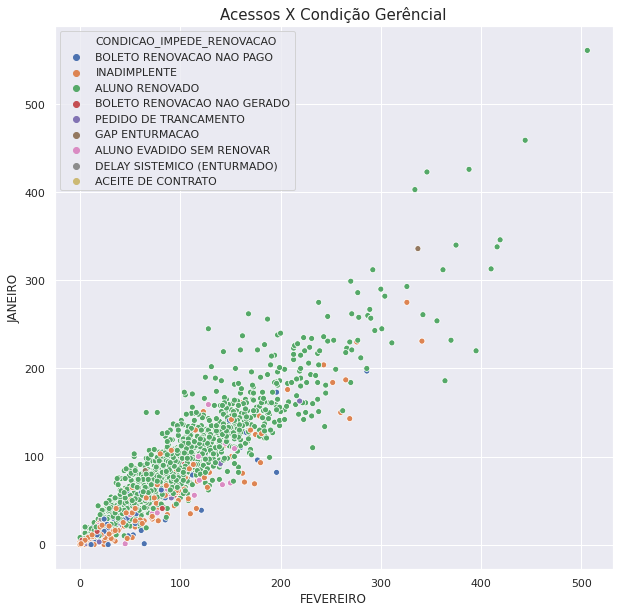

In [ ]:
# Cria os gráficos da relação entre as variáveis 
fig, axs = plt.subplots(figsize=(10, 10), ncols=1)
g23 = sns.scatterplot(x='FEVEREIRO', y='JANEIRO', hue='CONDICAO_IMPEDE_RENOVACAO', data=df_renovacao, ax=axs)

g23.set_title('Acessos X Condição Gerêncial', size=15)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#fig.savefig('/content/drive/My Drive/TCC/Graficos/g23.png')

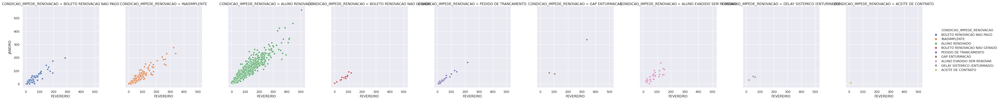

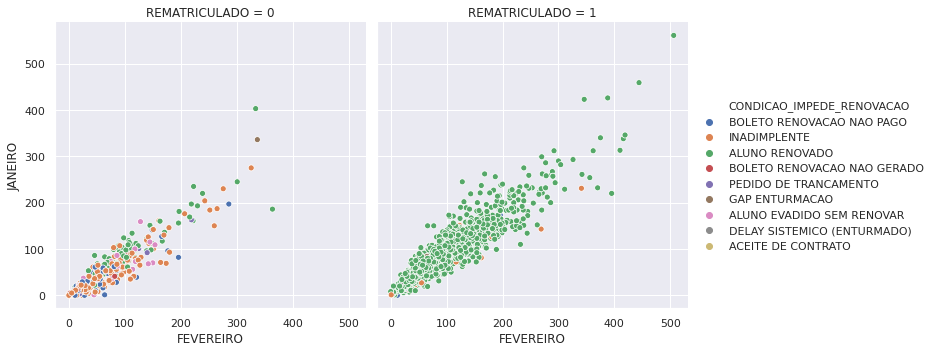

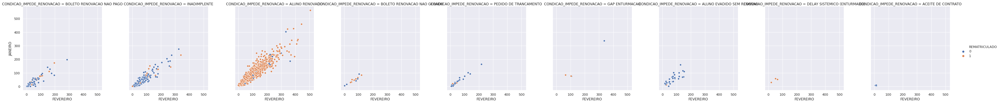

In [ ]:
# Cria os gráficos da relação entre as variáveis relacionadas e a variável alvo
g24 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='CONDICAO_IMPEDE_RENOVACAO', col='CONDICAO_IMPEDE_RENOVACAO', data=df_renovacao)
g25 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='CONDICAO_IMPEDE_RENOVACAO', col='REMATRICULADO', data=df_renovacao)
g26 = sns.relplot(x='FEVEREIRO', y='JANEIRO', hue='REMATRICULADO', col='CONDICAO_IMPEDE_RENOVACAO', data=df_renovacao)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#g24.savefig('/content/drive/My Drive/TCC/Graficos/g24.png')
#g25.savefig('/content/drive/My Drive/TCC/Graficos/g25.png')
#g26.savefig('/content/drive/My Drive/TCC/Graficos/g26.png')



---


Vamos observar logo abaixo também a multicolinearidade entre as variáveis:

* `CONDICAO_GERENCIAL`
* `CONDICAO_IMPEDE_RENOVACAO`

Pode-se observar claramente, tanto nas variáveis `CONDICAO_GERENCIAL` e `CONDICAO_IMPEDE_RENOVACAO`, a forte correlação entre os valores:

* *ALUNO RENOVADO*
* *1 - ALUNO RENOVADO*

Embora sejam variáveis diferentes em nosso dataframe, indicam praticamente a mesma intenção com relação a **variável alvo**. O que já foi observado anteriormente nos gráficos.

**OBS:** Em contato com o *stackeholder* do projeto, essas duas variáveis são analisadas em cima de outras informações/variáveis e afetam diretamente a ***variável alvo***. Foi decidido, nesse primeiro projeto, a eliminação delas, até para sabermos como o modelo irá se comportar sem a interferência dessas variáveis.

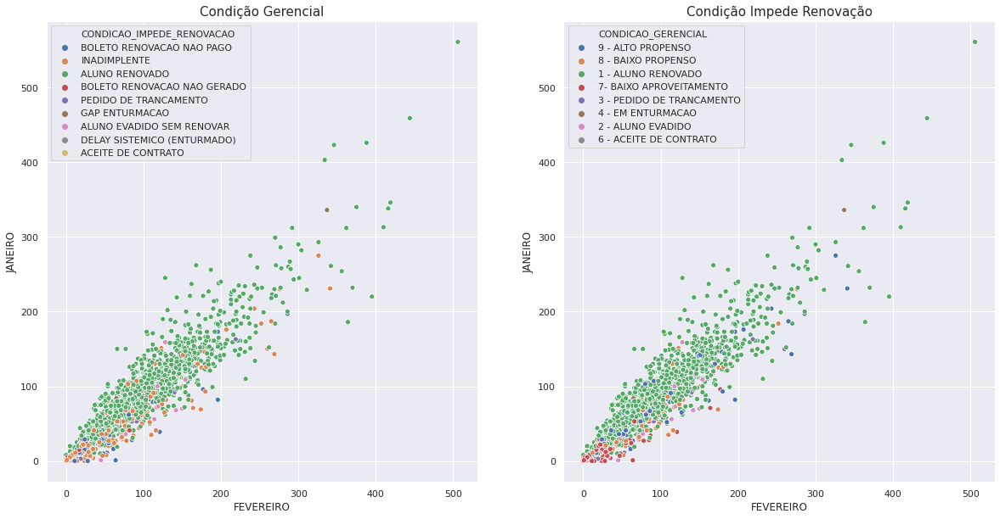

In [ ]:
# Relacionamento entre duas variáveis do dataframe
fig, axs = plt.subplots(figsize=(20, 10), ncols=2)
g27 = sns.scatterplot(x='FEVEREIRO', y='JANEIRO', hue='CONDICAO_IMPEDE_RENOVACAO', data=df_renovacao, ax=axs[0])
g28 = sns.scatterplot(x='FEVEREIRO', y='JANEIRO', hue='CONDICAO_GERENCIAL',  data=df_renovacao, ax=axs[1])

g27.set_title('Condição Gerencial', size=15)
g28.set_title('Condição Impede Renovação', size=15)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#fig.savefig('/content/drive/My Drive/TCC/Graficos/g27_28.png')



Um gráfico de contagem (count plot) pode ser considerado como um histograma através de uma variável categórica, em vez de quantitativa.

Referência: https://seaborn.pydata.org/generated/seaborn.countplot.html

Referência: https://seaborn.pydata.org/tutorial/categorical.html

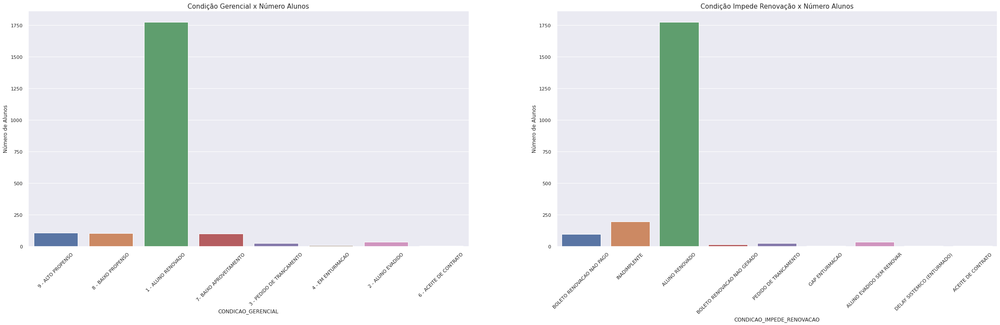

In [ ]:
fig, axs = plt.subplots(figsize=(40, 10), ncols=2)
g29 = sns.countplot(df_renovacao['CONDICAO_GERENCIAL'], ax=axs[0])
g30 = sns.countplot(df_renovacao['CONDICAO_IMPEDE_RENOVACAO'], ax=axs[1])

g29.set_title('Condição Gerencial x Número Alunos', size=15)
g29.set_ylabel('Número de Alunos')
g30.set_title('Condição Impede Renovação x Número Alunos', size=15)
g30.set_ylabel('Número de Alunos')

g29.set_xticklabels(g29.get_xticklabels(), rotation=45)
g30.set_xticklabels(g30.get_xticklabels(), rotation=45)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#fig.savefig('/content/drive/My Drive/TCC/Graficos/g29_30.png')

### Plotando demais gráficos para análise do restante das variáveis categóricas

In [ ]:
# Selecionando as variáveis categóricas
col_categoricas = ['TIPO_INADIMPLENCIA', 'RISCO_INADIMPLENCIA', 'CLASSE_PAGANTE_ANT', 'CLASSE_PAGANTE_ATU',  'FAIXA_DE_DIVIDA', 'FAIXA_APROVACAO', 'CLASSIFICACAO_PROP_EVASAO', 'CLASSIFICACAO_PROP_RENOVACAO']

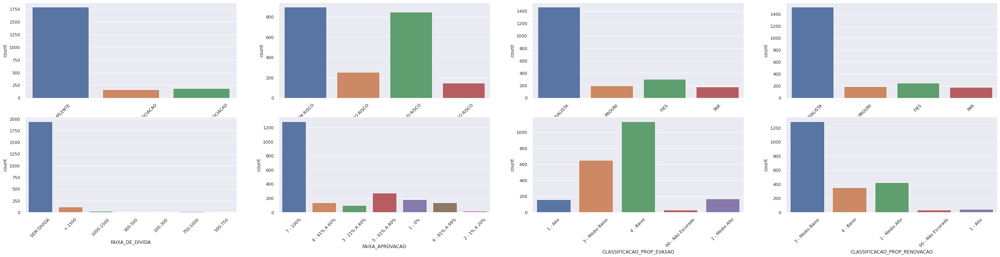

In [ ]:
# Loop para plotar os gráficos
fig, ax = plt.subplots(2, 4, figsize=(45, 10))
for variable, subplot in zip(col_categoricas, ax.flatten()):
    sns.countplot(df_renovacao[variable], ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(45)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#fig.savefig(('/content/drive/My Drive/TCC/Graficos/g31.png'))

## Correlação e Outliers

Vamos tentar identificar alguma correlação entre as variáveis númericas abaixo.

O coeficiente de correlação pode variar em termos de valor de -1 a +1. Quanto maior for o valor absoluto do coeficiente, mais forte é a relação entre as variáveis.

Para a correlação de *Pearson*, um valor absoluto de 1 indica uma relação linear perfeita. A correlação perto de 0 indica que não há relação linear entre as variáveis.

* Correlação negativa trata de uma correlação inversamente proporcional;
* Correlação positiva trata de uma correlação direta;


***Valor de $\rho$ (+ ou -)***
* 0.00 a 0.19 - Uma correlação bem fraca
* 0.20 a 0.39 - Uma correlação fraca
* 0.40 a 0.69 - Uma correlação moderada
* 0.70 a 0.89 - Uma correlação forte
* 0.90 a 1.00 - Uma correlação muito forte


In [ ]:
# Selecionando apenas as variáveis categóricas
col_categoricas = list(df_renovacao.select_dtypes(include=['object']).columns)

# Fazendo uma cópia do dataframe e excluindo as variáveis categóricas
df_corr = df_renovacao.copy()
df_corr.drop(col_categoricas, axis=1, inplace=True)
df_corr.drop(['COD_MATRICULA', 'ALUNO_MATRICULADO', 'COD_CURSO', 'COD_TURNO', 'COD_TIPO_CURSO', 'REMATRICULADO', 'JANEIRO', 'FEVEREIRO'], axis=1, inplace=True)

df_corr

,ALUNO_MATRICULADO_PROX_PERIODO,PRV_ANT,PRV_ATU,VAL_A_PAGAR,VAL_A_PAGAR_PAR,VAL_DIVIDA_MENS,VAL_DIVIDA_TOTAL,ADIMP_N_REN,CR_PER_ANT,QTD_ACESSOS_19_2,QTD_ACESSOS_20_1,IND_INDICIO_EVASAO,ACEITE_CONTRATO,REQ_AGEND_TRANC
0,0,0,0,51.18,0.00,0.00,0.00,1,9.00,32.0,21.0,0,0,0
1,0,0,0,0.00,0.00,3111.20,3111.20,0,5.91,48.0,48.0,0,1,0
2,0,0,0,0.00,0.00,3238.77,3238.77,0,5.27,53.0,46.0,0,0,0
3,1,0,0,2521.12,0.00,0.00,0.00,0,9.89,130.0,119.0,0,1,0
4,1,0,0,170.96,0.00,0.00,0.00,0,3.50,125.0,70.0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2138,1,0,0,534.38,0.00,0.00,0.00,0,7.54,143.0,133.0,0,1,0
2139,1,0,0,1157.48,5.16,0.00,5.16,0,6.31,64.0,42.0,0,1,0
2140,0,0,0,0.00,4.88,0.00,0.00,0,7.43,154.0,109.0,1,1,0
2141,1,0,0,1486.82,606.04,0.00,489.79,0,6.14,154.0,147.0,0,1,0


In [ ]:
# Matriz de correlação
corr = df_corr.corr()
display(corr)

,ALUNO_MATRICULADO_PROX_PERIODO,PRV_ANT,PRV_ATU,VAL_A_PAGAR,VAL_A_PAGAR_PAR,VAL_DIVIDA_MENS,VAL_DIVIDA_TOTAL,ADIMP_N_REN,CR_PER_ANT,QTD_ACESSOS_19_2,QTD_ACESSOS_20_1,IND_INDICIO_EVASAO,ACEITE_CONTRATO,REQ_AGEND_TRANC
ALUNO_MATRICULADO_PROX_PERIODO,1.000000,0.044219,0.046465,0.304830,0.067152,-0.252097,-0.312372,-0.327784,0.310741,0.126423,0.202424,-0.300182,0.381231,-0.197446
PRV_ANT,0.044219,1.000000,0.813966,0.168575,-0.027322,-0.023726,-0.035336,-0.000137,0.014011,0.024432,0.014679,-0.012202,0.018073,-0.019388
PRV_ATU,0.046465,0.813966,1.000000,0.184725,-0.022239,-0.038992,-0.046260,-0.041453,0.022915,0.036502,0.030779,-0.023661,0.034297,-0.027714
VAL_A_PAGAR,0.304830,0.168575,0.184725,1.000000,0.244281,0.003678,-0.018142,-0.157943,0.185268,0.105406,0.145671,-0.049170,0.181932,-0.041488
VAL_A_PAGAR_PAR,0.067152,-0.027322,-0.022239,0.244281,1.000000,-0.034194,0.000084,-0.036248,0.005543,0.014852,0.031025,-0.019427,0.030078,-0.007821
VAL_DIVIDA_MENS,-0.252097,-0.023726,-0.038992,0.003678,-0.034194,1.000000,0.935312,-0.063237,-0.079932,-0.006514,-0.040723,-0.009735,-0.110703,-0.027135
VAL_DIVIDA_TOTAL,-0.312372,-0.035336,-0.046260,-0.018142,0.000084,0.935312,1.000000,-0.075163,-0.104099,-0.005358,-0.048513,0.003311,-0.110845,-0.027169
ADIMP_N_REN,-0.327784,-0.000137,-0.041453,-0.157943,-0.036248,-0.063237,-0.075163,1.000000,-0.228176,-0.138178,-0.183877,0.111896,-0.362405,0.147327
CR_PER_ANT,0.310741,0.014011,0.022915,0.185268,0.005543,-0.079932,-0.104099,-0.228176,1.000000,0.289579,0.325474,-0.022892,0.430647,-0.051524
QTD_ACESSOS_19_2,0.126423,0.024432,0.036502,0.105406,0.014852,-0.006514,-0.005358,-0.138178,0.289579,1.000000,0.923276,-0.020752,0.198050,-0.056705


No caso existe uma correlação forte e muito forte entre as variáveis:

* `PRV_ANT` - *0,81* - Indica se o aluno faz parte do Programa de Crédito Estudantil (PRAVALER) no semestre anterior.
* `PRV_ATU` - *0,81* - Indica se o aluno faz parte do Programa de Crédito Estudantil (PRAVALER)  no semestre atual.
* `VAL_DIVIDA_MENS` - *0,94* - Valor a pagar de mensalidades.
* `VAL_DIVIDA_TOTAL` - *0,94* - Valor total a pagar de dívidas.
* `QTDE_ACESSOS_19_02` - *0,92* - Quantidade de acessos ao Portal Acadêmico até uma determinada data.
* `QTDE_ACESSOS_20_01` - *0,92* - Quantidade de acessos ao Portal Acadêmico até uma determinada data.
* `IND_INDICIO_EVASAO` - *0,74* - Indica o indício de evasão do aluno.
* `REQ_AGEND_TRANC` - *0,74* - Indica se o aluno abriu algum requerimento de trancamento de matrícula.

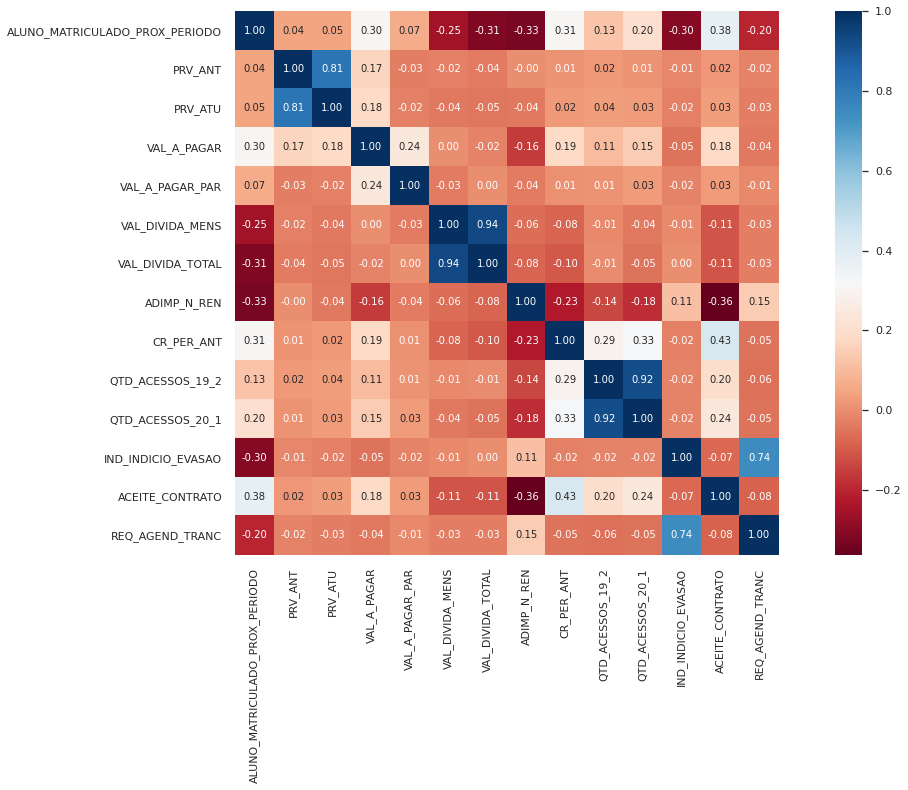

In [ ]:
# Plotar um heatmap a partir das correlações
fig, axs = plt.subplots(figsize=(20, 10))

sns.heatmap(corr, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot=True, ax=axs);

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#fig.savefig(('/content/drive/My Drive/TCC/Graficos/g32.png'))



---

Vamos verificar se existem *outliers*.

Em estatística, ***outlier***, **valor aberrante** ou **valor atípico**, é uma observação que apresenta um grande afastamento das demais da série (que está "fora" dela), ou que é inconsistente.

A existência de outliers implica, tipicamente, em prejuízos a interpretação dos resultados dos testes estatísticos aplicados às amostras.

Para confirmar, há duas maneiras rápidas que auxiliam a detecção de *outliers*. São elas:

* Resumo estatístico por meio do método `describe()`
* Plotar `boxplots` para a variável.

Referência: https://seaborn.pydata.org/generated/seaborn.boxplot.html


No caso dessas variáveis abaixo, apesar de apresentar alguns valores mais deslocados, não são considerados outliers, pois são valores conhecidos e fazem parte da faixa de valores possíveis aplicados na operação do dia-a-dia.

In [ ]:
# Resumo estatístico das variáveis numéricas
df_corr.describe()

,ALUNO_MATRICULADO_PROX_PERIODO,PRV_ANT,PRV_ATU,VAL_A_PAGAR,VAL_A_PAGAR_PAR,VAL_DIVIDA_MENS,VAL_DIVIDA_TOTAL,ADIMP_N_REN,CR_PER_ANT,QTD_ACESSOS_19_2,QTD_ACESSOS_20_1,IND_INDICIO_EVASAO,ACEITE_CONTRATO,REQ_AGEND_TRANC
count,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000
mean,0.810079,0.036864,0.024732,525.430154,15.624316,300.696370,401.229720,0.063462,6.567438,87.538964,77.901540,0.051797,0.955670,0.029398
std,0.392330,0.188472,0.155342,532.346447,111.903839,1228.325304,1381.496052,0.243850,2.206718,60.468967,55.480998,0.221668,0.205876,0.168959
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.175000,47.000000,41.000000,0.000000,1.000000,0.000000
50%,1.000000,0.000000,0.000000,445.180000,0.000000,0.000000,0.000000,0.000000,7.090000,74.000000,66.000000,0.000000,1.000000,0.000000
75%,1.000000,0.000000,0.000000,866.935000,0.000000,0.000000,0.000000,0.000000,7.885000,111.000000,102.000000,0.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,3210.350000,1185.360000,15131.220000,15370.450000,1.000000,10.000000,506.000000,561.000000,1.000000,1.000000,1.000000


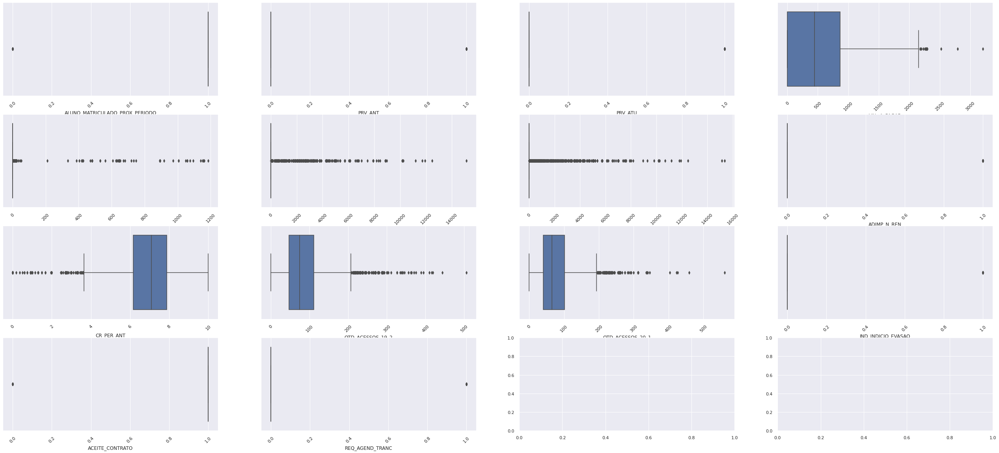

In [ ]:
# Selecionando apenas as variáveis numéricas
col_numericas = list(df_corr.select_dtypes(include=['number']).columns)

# Loop para plotar os gráficos
fig, ax = plt.subplots(4, 4, figsize=(45, 20))
for variable, subplot in zip(col_numericas, ax.flatten()):
    sns.boxplot(df_corr[variable], ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(45)

# Exportar o gráfico, substitua o caminho pelo seu caminho de preferência
#fig.savefig(('/content/drive/My Drive/TCC/Graficos/g33.png'))

## Selecionando e excluindo colunas com multicolinearidade

Após análise detalhada verificamos que existem variáveis com possível multicolinearidade, e devem ser excluídas.

* `CONDICAO_GERENCIAL` 
* `CONDICAO_IMPEDE_RENOVACAO` 

**OBS:** Em contato com o *stackeholder* do projeto, essas duas variáveis são analisadas em cima de outras informações/variáveis e afetam diretamente a ***variável alvo***. Foi decidido, nesse primeiro projeto, a eliminação das mesmas, até para sabermos como o modelo irá se comportar sem a interferência dessas variáveis.

In [ ]:
# Exclui as variáveis
df_renovacao.drop(['CONDICAO_GERENCIAL', 'CONDICAO_IMPEDE_RENOVACAO'], axis=1, inplace=True)

In [ ]:
# Excluiremos as demais variáveis que não usaremos para o modelo
df_renovacao.drop(['ALUNO_MATRICULADO','COD_CURSO', 'COD_TURNO', 'COD_TIPO_CURSO', 'REMATRICULADO', 'JANEIRO', 'FEVEREIRO'], axis=1, inplace=True)

In [ ]:
# Renomeando a variável alvo para um nome mais sugestivo
df_renovacao.rename(columns={'ALUNO_MATRICULADO_PROX_PERIODO': 'REMATRICULADO'}, inplace=True)

In [ ]:
df_renovacao

,COD_MATRICULA,REMATRICULADO,TIPO_INADIMPLENCIA,RISCO_INADIMPLENCIA,CLASSE_PAGANTE_ANT,CLASSE_PAGANTE_ATU,NOVO_FIES,PRV_ANT,PRV_ATU,LATE_COMER,NOM_SITUACAO_ALUNO,VAL_A_PAGAR,VAL_A_PAGAR_PAR,VAL_DIVIDA_MENS,VAL_DIVIDA_TOTAL,FAIXA_DE_DIVIDA,ADIMP_N_REN,CR_PER_ANT,FAIXA_APROVACAO,QTD_ACESSOS_19_2,QTD_ACESSOS_20_1,IND_INDICIO_EVASAO,CLASSIFICACAO_PROP_EVASAO,CLASSIFICACAO_PROP_RENOVACAO,ACEITE_CONTRATO,REQ_AGEND_TRANC,SAFRA
0,200701339023,0,ADIMPLENTE,SEM RISCO,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,51.18,0.00,0.00,0.00,SEM DIVIDA,1,9.00,7 - 100%,32.0,21.0,0,1 - Alto,3 - Médio Baixo,0,0,VETERANO
1,200702198245,0,INADIMPLENTE SEM NEGOCIACAO,MEDIO RISCO,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,0.00,0.00,3111.20,3111.20,> 1500,0,5.91,4 - 41% A 60%,48.0,48.0,0,3 - Médio Baixo,4 - Baixo,1,0,CALOURO
2,200702198679,0,INADIMPLENTE SEM NEGOCIACAO,MEDIO RISCO,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,0.00,0.00,3238.77,3238.77,> 1500,0,5.27,3 - 21% A 40%,53.0,46.0,0,4 - Baixo,4 - Baixo,0,0,VETERANO
3,200801431011,1,ADIMPLENTE,SEM RISCO,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,2521.12,0.00,0.00,0.00,SEM DIVIDA,0,9.89,7 - 100%,130.0,119.0,0,4 - Baixo,2 - Médio Alto,1,0,VETERANO
4,200901402225,1,ADIMPLENTE,BAIXO RISCO,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,170.96,0.00,0.00,0.00,SEM DIVIDA,0,3.50,4 - 41% A 60%,125.0,70.0,0,00 - Não Escorado,00 - Não Escorado,1,0,VETERANO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2138,201912030837,1,ADIMPLENTE,BAIXO RISCO,MENSALISTA,MENSALISTA,NÃO,0,0,ON TIME COMER,Ativo,534.38,0.00,0.00,0.00,SEM DIVIDA,0,7.54,7 - 100%,143.0,133.0,0,4 - Baixo,3 - Médio Baixo,1,0,VETERANO
2139,201912030853,1,ADIMPLENTE,BAIXO RISCO,PAR,PAR,NÃO,0,0,ON TIME COMER,Ativo,1157.48,5.16,0.00,5.16,SEM DIVIDA,0,6.31,5 - 61% A 80%,64.0,42.0,0,2 - Médio Alto,3 - Médio Baixo,1,0,VETERANO
2140,201912030861,0,ADIMPLENTE,MEDIO RISCO,PAR,PAR,NÃO,0,0,ON TIME COMER,Trancado,0.00,4.88,0.00,0.00,SEM DIVIDA,0,7.43,7 - 100%,154.0,109.0,1,3 - Médio Baixo,3 - Médio Baixo,1,0,VETERANO
2141,201912030934,1,INADIMPLENTE COM NEGOCIACAO,BAIXO RISCO,PAR,PAR,NÃO,0,0,ON TIME COMER,Ativo,1486.82,606.04,0.00,489.79,SEM DIVIDA,0,6.14,7 - 100%,154.0,147.0,0,4 - Baixo,3 - Médio Baixo,1,0,VETERANO


## Salvando o conjunto de dados em um novo arquivo

Foi salvo o dataframe em um novo arquivo do tipo CSV para a próxima etapa de ***Criação do Modelo***

In [ ]:
# Salva os dados do dataframe limpo em um arquivo CSV
df_renovacao.to_csv( root_path + 'base_model.csv', sep='|', index=False)